# Pandas

This notebook covers a _lot_, go through it carefully and _read_ the code. Then work on _understanding_ it. Then apply it to your data set. Then once you've done that, you'll probably _actually_ understand it.

Messing about with the [NSW Penalty data](http://www.osr.nsw.gov.au/sites/default/files/file_manager/penalty_data_set_0.csv)

`imports`, you've seen this before!

In [11]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

Some magic that tells jupyter to put graphs and things in the notebook instead of the default behaviour which is to save it as a file.

In [33]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (20, 10)

In [34]:
saved_style_state = matplotlib.rcParams.copy() #give us a style state to go back to

Let's check to see if we've already downloaded the data. It's a big file, so we don't want to do it every time we run the code. Even just loading from file takes a few seconds!

Pandas is pretty smart, it can get data from the internet just as easily as from the file system, it just takes a bit longer.


In [36]:
filepath = "daily intake .xlsx"
print("loading from file")

df5 = pd.read_excel(filepath)
print("done")

loading from file
done


In [37]:
df5.head()

,Consumption,"Vegetables, legumes/beans",Fruit(d),Fresh or canned fruit,"Milk, yoghurt, cheese and alternatives",Meats and alternatives,Grains (cereals)
0,Male - Proportion with usual daily intake less...,96.5,70.7,89.1,89.9,79.1,66.6
1,Number of males with usual daily intake less t...,7971.6,5838.4,7354.2,7422.7,6533.9,5496.7
2,Female - Proportion with usual daily intake le...,94.8,77.0,92.0,96.5,87.0,75.6
3,Number of females with usual daily intake less...,7656.9,6221.8,7434.3,7793.6,7031.3,6109.2


In [1]:
df5.drop([0, 2])

NameError: name 'df5' is not defined

In [40]:
df5.shape

(4, 7)

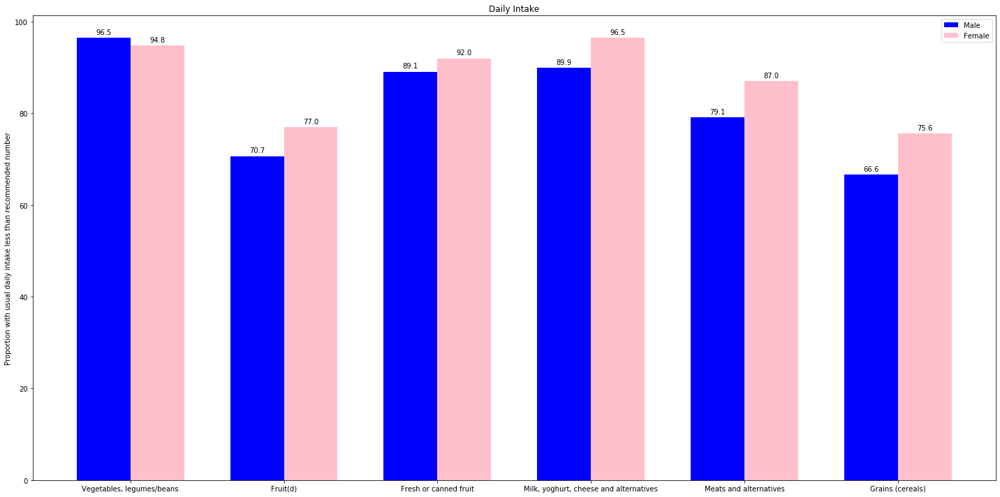

In [46]:

labels = ['Vegetables, legumes/beans', 'Fruit(d)', 'Fresh or canned fruit', 'Milk, yoghurt, cheese and alternatives', 'Meats and alternatives', 'Grains (cereals)']
male_proportions = [96.5, 70.7, 89.1, 89.9, 79.1, 66.6]
female_proportions = [94.8, 77.0, 92.0, 96.5, 87.0, 75.6]

x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, male_proportions, width, label='Male', color="blue")
rects2 = ax.bar(x + width/2, female_proportions, width, label='Female', color="pink")

ax.set_ylabel('Proportion with usual daily intake less than recommended number')
ax.set_title('Daily Intake')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

In [10]:
df5.columns

Index(['Consumption ', 'Vegetables, legumes/beans ', 'Fruit(d)',
       'Fresh or canned fruit', 'Milk, yoghurt, cheese and alternatives',
       'Meats and alternatives', 'Grains (cereals)'],
      dtype='object')

In [14]:
row_one = df5.iloc[1]
row_one

Consumption                               Number of males with usual daily intake less t...
Vegetables, legumes/beans                                                            7971.6
Fruit(d)                                                                             5838.4
Fresh or canned fruit                                                                7354.2
Milk, yoghurt, cheese and alternatives                                               7422.7
Meats and alternatives                                                               6533.9
Grains (cereals)                                                                     5496.7
Name: 1, dtype: object

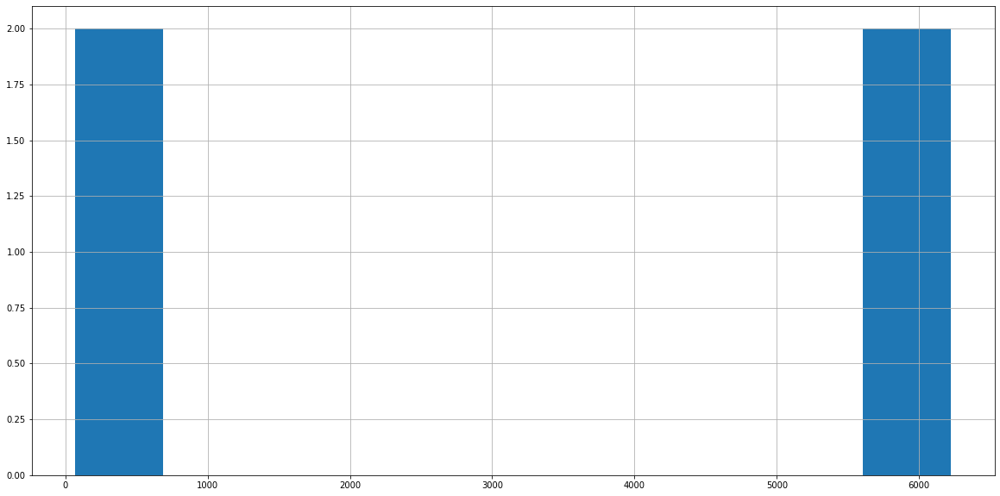

In [23]:
df5["Fruit(d)"].hist()

NameError: name 'df' is not defined

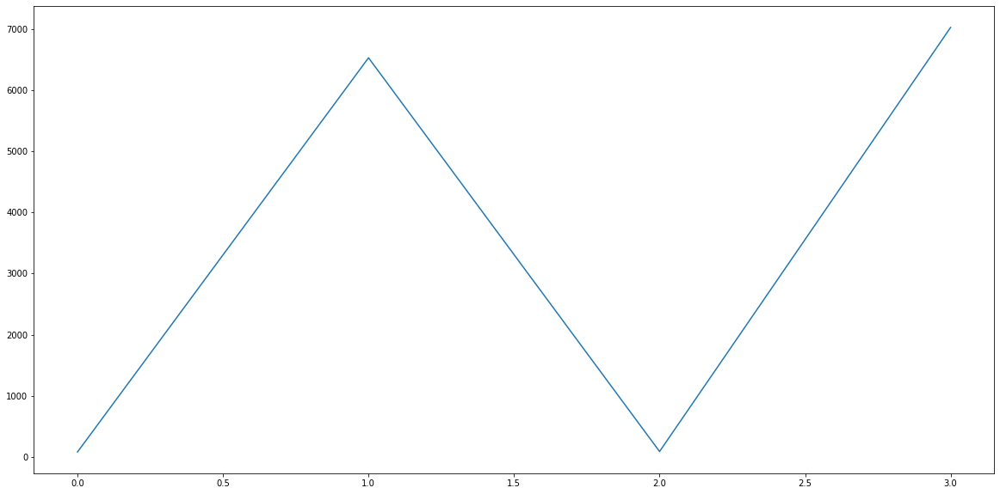

In [19]:
df5["Meats and alternatives"].plot()

In [13]:
df4.head()

,Food Group,2-18,19 years and over,Total 2 years and over
0,"Vegetables, legumes/beans",NaN,NaN,NaN
1,Proportion with usual daily intake less than r...,99.6,96.5,97.2
2,Number of males with usual daily intake less t...,2439.0,7971.6,10410.5
3,Fruit(d),NaN,NaN,NaN
4,Proportion with usual daily intake less than r...,53.5,70.7,66.8


In [7]:
df4.isnull()

,Food Group,2-18,19 years and over
1,False,False,False
2,False,False,False
4,False,False,False
5,False,False,False
7,False,False,False
8,False,False,False
10,False,False,False
11,False,False,False
13,False,False,False
14,False,False,False


In [3]:
vegetables = df4.head(2)
vegetables.rename(columns={"Food Group": "Vegetables"}, inplace=True)

NameError: name 'df4' is not defined

In [9]:
df4.shape

(15, 3)

In [10]:
row_one = df4.iloc[1] #index numbers - columns 
row_one

Food Group           Number of males with usual daily intake less t...
2-18                                                              2439
19 years and over                                               7971.6
Name: 2, dtype: object

In [11]:
filepath = "FNDDS/FNDDS_Foods_Beverages.xlsx"
print("loading from file")

df2 = pd.read_excel(filepath)
print("done")

loading from file
done


In [12]:
df2.head()

,Food code,Main food description,Additional food description,WWEIA Category number,WWEIA Category description
0,11000000,"Milk, human",NaN,9602,Human milk
1,11100000,"Milk, NFS",NaN,1004,"Milk, reduced fat"
2,11111000,"Milk, whole",3.5% or 3.8% fat milk; leche fresca,1002,"Milk, whole"
3,11111100,"Milk, low sodium, whole",NaN,1002,"Milk, whole"
4,11111150,"Milk, calcium fortified, whole",NaN,1002,"Milk, whole"


In [13]:
filepath = "FNDDS/FNDDS_Portions_Weights.xlsx"
print("loading from file")

df3 = pd.read_excel(filepath)
print("done")

loading from file
done


In [14]:
df3.drop(['Food code', 'Subcode'], axis=1, inplace=True)
df3.head()

,Main food description,Subcode description,WWEIA Category number,WWEIA Category description,Seq num,Portion description,Portion weight (g)
0,"Milk, human",NaN,9602,Human milk,1,1 cup,246.0
1,"Milk, human",NaN,9602,Human milk,2,Quantity not specified,0.0
2,"Milk, human",NaN,9602,Human milk,3,1 fl oz,30.8
3,"Milk, NFS",NaN,1004,"Milk, reduced fat",1,1 cup,244.0
4,"Milk, NFS",NaN,1004,"Milk, reduced fat",2,1 fl oz,30.5


In [15]:
pd.melt(df3)

,variable,value
0,Main food description,"Milk, human"
1,Main food description,"Milk, human"
2,Main food description,"Milk, human"
3,Main food description,"Milk, NFS"
4,Main food description,"Milk, NFS"
...,...,...
228293,Portion weight (g),120
228294,Portion weight (g),248
228295,Portion weight (g),31
228296,Portion weight (g),23


In [16]:
df3.shape

(32614, 7)

In [17]:
df2.drop(['Unnamed: 3', 'Unnamed: 2'], axis=1, inplace=True)
df2.head()

KeyError: "['Unnamed: 3' 'Unnamed: 2'] not found in axis"

In [18]:
df2_new = df2.rename(columns={"Unnamed: 1": "Main food description"})
print(df2_new)
df2.head()

Food code                     Main food description  \
0      11000000                               Milk, human   
1      11100000                                 Milk, NFS   
2      11111000                               Milk, whole   
3      11111100                   Milk, low sodium, whole   
4      11111150            Milk, calcium fortified, whole   
...         ...                                       ...   
7078   99997802          Tomatoes as ingredient in omelet   
7079   99997804  Other vegetables as ingredient in omelet   
7080   99997810         Vegetables as ingredient in curry   
7081   99998130         Sauce as ingredient in hamburgers   
7082   99998210      Industrial oil as ingredient in food   

              Additional food description  WWEIA Category number  \
0                                     NaN                   9602   
1                                     NaN                   1004   
2     3.5% or 3.8% fat milk; leche fresca                   1002   
3

,Food code,Main food description,Additional food description,WWEIA Category number,WWEIA Category description
0,11000000,"Milk, human",NaN,9602,Human milk
1,11100000,"Milk, NFS",NaN,1004,"Milk, reduced fat"
2,11111000,"Milk, whole",3.5% or 3.8% fat milk; leche fresca,1002,"Milk, whole"
3,11111100,"Milk, low sodium, whole",NaN,1002,"Milk, whole"
4,11111150,"Milk, calcium fortified, whole",NaN,1002,"Milk, whole"


In [19]:
df2.shape

(7083, 5)

In [72]:
df1.drop(['Public Food Key', 'Scientific Name', 'Specific Gravity', 'Analysed portion', 'Unanalysed portion', 'Classification ID'], axis=1, inplace=True)
df1.head(7084)

,Food Profile ID,Derivation,Name,Description,Sampling details,Nitrogen Factor,Fat Factor,Classification Name
0,10995,Borrowed,"Cardamom seed, dried, ground",Ground spice commonly used in Indian cooking a...,The majority of nutrient data were borrowed fr...,6.25,0.956,Herbs(dried) and spices
1,11014,Borrowed,"Chilli (chili), dried, ground","Dried and ground red pepper, characterised by ...",The majority of nutrient data was borrowed USD...,6.25,0.800,Herbs(dried) and spices
2,10996,Borrowed,"Cinnamon, dried, ground",Dried and ground bark or quills of Cinnamomum ...,The majority of nutrient data were borrowed fr...,6.25,0.956,Herbs(dried) and spices
3,10997,Borrowed,"Cloves, dried, ground","Dried and ground, unopened flower buds of Syzy...",The majority of nutrient data were borrowed fr...,6.25,0.956,Herbs(dried) and spices
4,10998,Borrowed,"Coriander seed, dried, ground",Dried and ground fruit or seed of Coriandrum s...,The majority of nutrient data were borrowed fr...,6.25,0.956,Herbs(dried) and spices
...,...,...,...,...,...,...,...,...
1529,13387,Recipe,"Zucchini, green skin, fresh, unpeeled, fried, ...","A variety of summer squash, picked when small....",These nutrient data were derived using a recip...,0.00,0.000,Squash and zucchini
1530,13388,Recipe,"Zucchini, green skin, fresh, unpeeled, boiled,...","Variety of marrow or summer squash, picked whe...",These nutrient data were derived using a recip...,0.00,0.000,Squash and zucchini
1531,13384,Analysed,"Zucchini, golden, fresh, unpeeled, raw",Variety of squash which has a yellow smooth sk...,The majority of nutrient data were derived fro...,6.25,0.800,Squash and zucchini
1532,13404,Recipe,"Zucchini, golden, fresh, unpeeled, fried, no a...",Variety of squash which has a yellow smooth sk...,These nutrient data were derived using a recip...,0.00,0.000,Squash and zucchini


In [73]:
df1.columns

Index(['Food Profile ID', 'Derivation', 'Name', 'Description',
       'Sampling details', 'Nitrogen Factor', 'Fat Factor',
       'Classification Name'],
      dtype='object')

In [74]:
df1.shape

(1534, 8)

In [36]:
row_one = df1.iloc[1] #index numbers - columns 
row_one

Food Profile ID                                                    11014
Derivation                                                      Borrowed
Name                                       Chilli (chili), dried, ground
Description            Dried and ground red pepper, characterised by ...
Sampling details       The majority of nutrient data was borrowed USD...
Nitrogen Factor                                                     6.25
Fat Factor                                                           0.8
Classification Name                            Herbs(dried)  and spices 
Name: 1, dtype: object

`dataframe.head()` gives the top 5 rows, if it was `dataframe.head(3)` it would give the top 3 rows. 

We can also get the list of columns out of the data frame

In [75]:
df1['Name'] = df1['Name'].str.replace(r'\W',"")
print(df1)
#experimented with using words 

Food Profile ID Derivation  \
0               10995   Borrowed   
1               11014   Borrowed   
2               10996   Borrowed   
3               10997   Borrowed   
4               10998   Borrowed   
...               ...        ...   
1529            13387     Recipe   
1530            13388     Recipe   
1531            13384   Analysed   
1532            13404     Recipe   
1533            13385     Recipe   

                                               Name  \
0                           Cardamomseeddriedground   
1                            Chillichilidriedground   
2                               Cinnamondriedground   
3                                 Clovesdriedground   
4                          Corianderseeddriedground   
...                                             ...   
1529  Zucchinigreenskinfreshunpeeledfriednoaddedfat   
1530    Zucchinigreenskinfreshunpeeledboileddrained   
1531                 Zucchinigoldenfreshunpeeledraw   
1532     Zucchinigolden

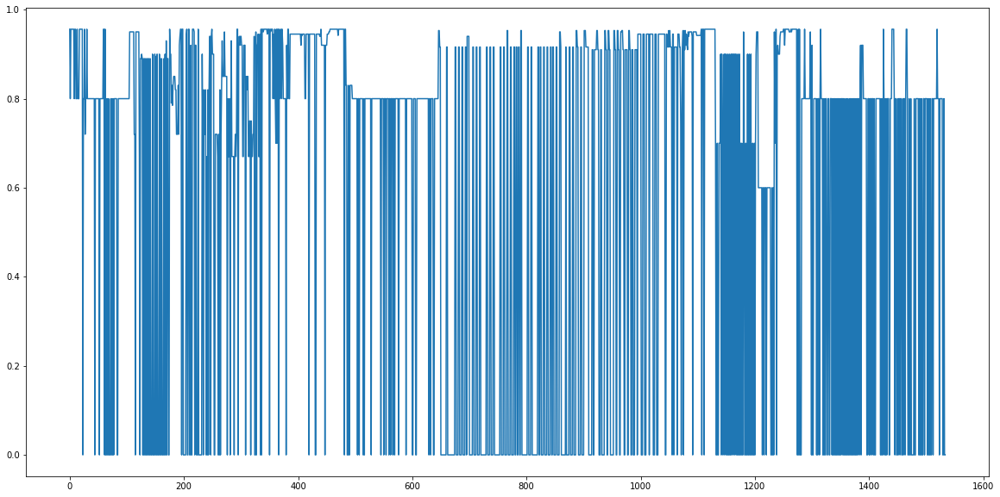

In [131]:
df1["Fat Factor"].plot()

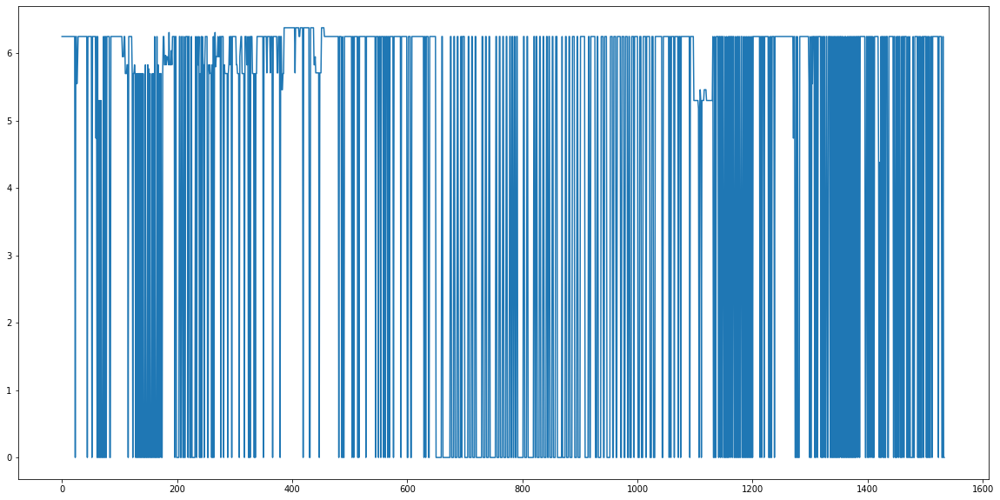

In [16]:
df1["Nitrogen Factor"].plot()

In [38]:
import seaborn as sns # just a conventional alias, don't know why
import numpy as np

corr = df1.corr() # compute and plot the pair-wise correlations
corr

,Food Profile ID,Nitrogen Factor,Fat Factor
Food Profile ID,1.000000,0.011671,0.025695
Nitrogen Factor,0.011671,1.000000,0.982446
Fat Factor,0.025695,0.982446,1.000000


In [39]:
corr = df1[['Food Profile ID', 'Derivation', 'Description', 'Sampling details', 'Nitrogen Factor', 'Fat Factor', 'Classification Name']].corr() # compute and plot the pair-wise correlations
corr

,Food Profile ID,Nitrogen Factor,Fat Factor
Food Profile ID,1.000000,0.011671,0.025695
Nitrogen Factor,0.011671,1.000000,0.982446
Fat Factor,0.025695,0.982446,1.000000


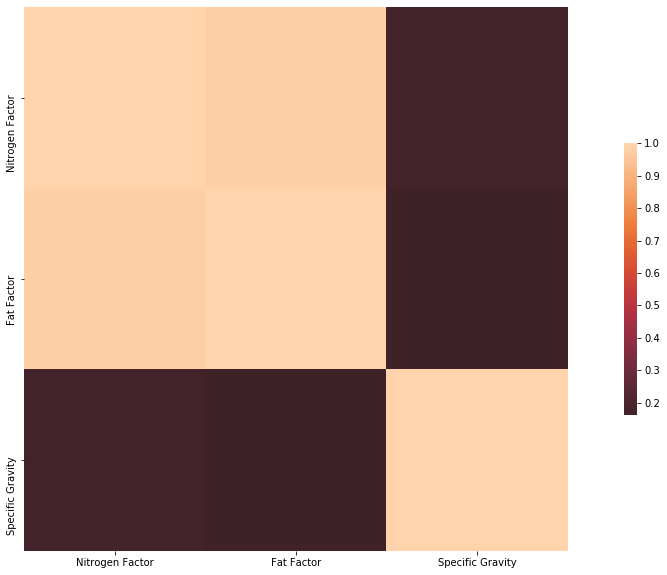

In [14]:
sns.heatmap(corr, vmax=1,  square=True, center=0, cbar_kws={"shrink": 0.5})

In [136]:
# look at names from d1
# look at main description from d2 
# compare the food groups - now: the grains !! 

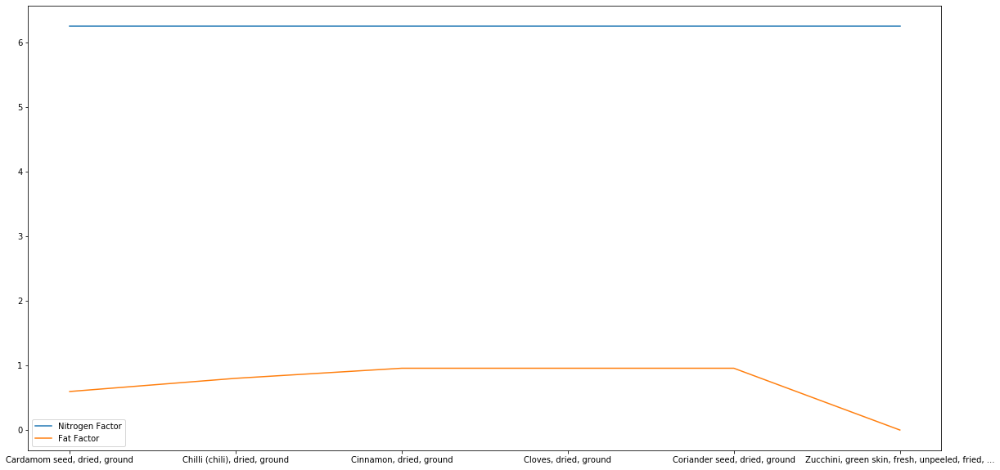

In [20]:
data_frame1 = pd.DataFrame({
    "Nitrogen Factor": [6.25, 6.25, 6.25, 6.25, 6.25, 6.25],
    "Fat Factor": [0.596, 0.800, 0.956, 0.956, 0.956, 0.000]
    }, index=["Cardamom seed, dried, ground", "Chilli (chili), dried, ground", "Cinnamon, dried, ground", "Cloves, dried, ground", "Coriander seed, dried, ground", "Zucchini, green skin, fresh, unpeeled, fried, ..."])
lines = data_frame1.plot.line()

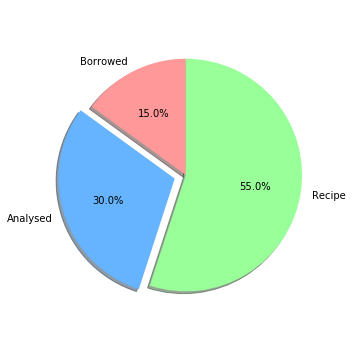

Text(0.5, 1, 'Derivations of Australian Foods/Nutrients')

In [109]:
labels_derivations = ['Borrowed', 'Analysed', 'Recipe']
sizes = [15, 30, 55]
explode = (0, 0.1, 0)  
colors = ['#ff9999','#66b3ff','#99ff99']
fig1, ax1 = plt.subplots(figsize=(5, 5))
ax1.pie(sizes, explode=explode, labels=labels_derivations, autopct='%1.1f%%',
        shadow=True, startangle=90, colors=colors)
ax1.axis('equal')  
plt.tight_layout()
plt.show()
ax1.set_title("Derivations of Australian Foods/Nutrients")

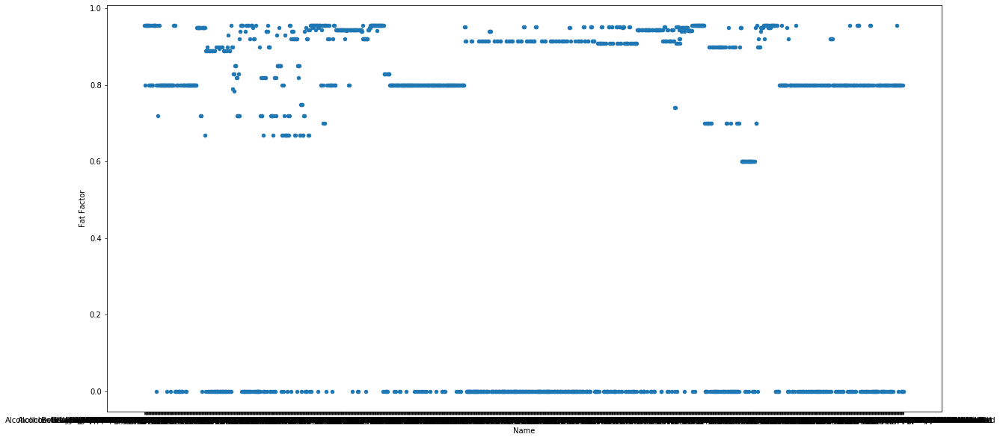

In [46]:
df1.plot.scatter(x='Name', y='Fat Factor')
#deconstruct 

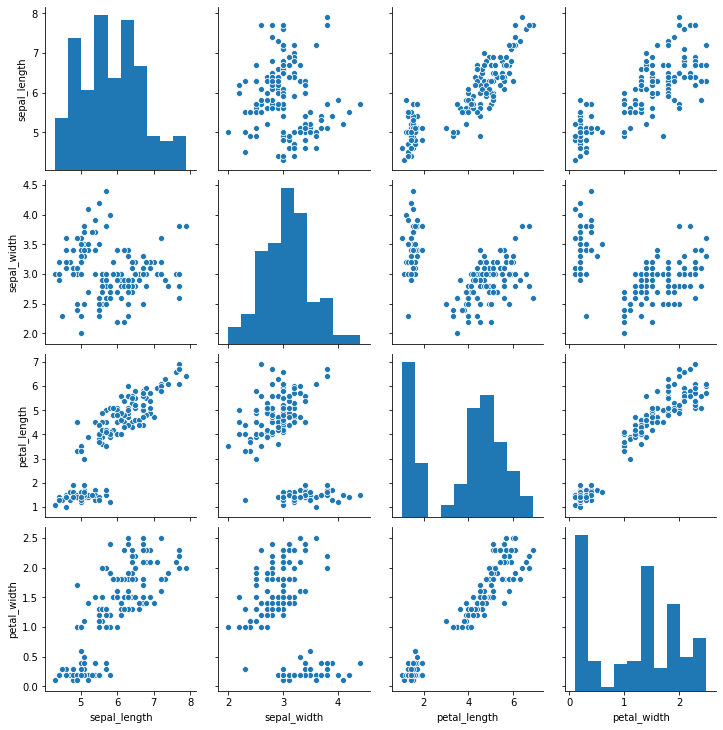

In [54]:
iris = sns.load_dataset('iris')
sns.pairplot(iris) #testing data

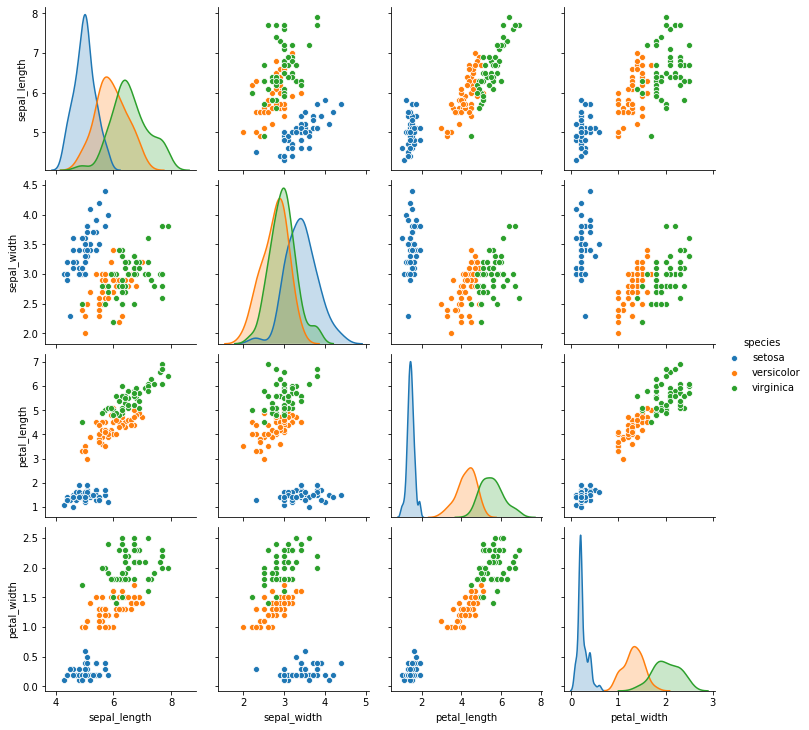

In [82]:
sns.pairplot(iris, hue='species')

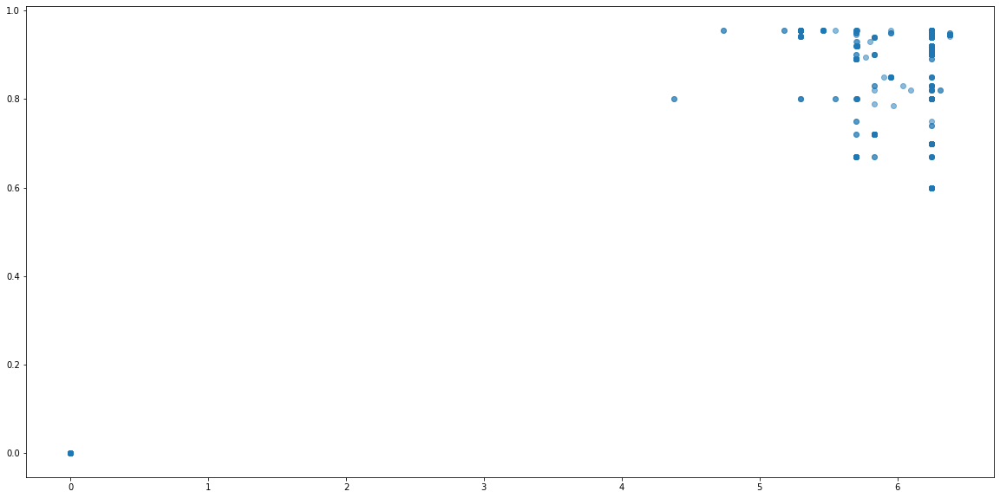

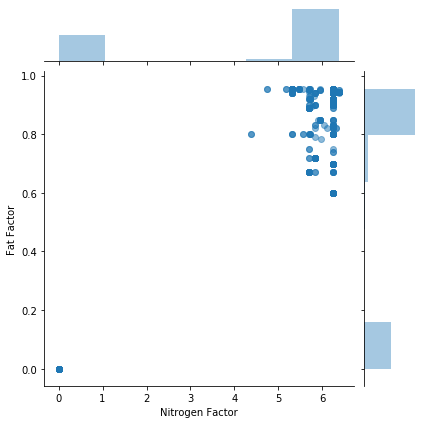

In [85]:
x, y = df1['Nitrogen Factor'], df1['Fat Factor']
plt.scatter(x, y, alpha=0.5)
sns.jointplot(x, y, kind='scatter', joint_kws={'alpha':0.5})

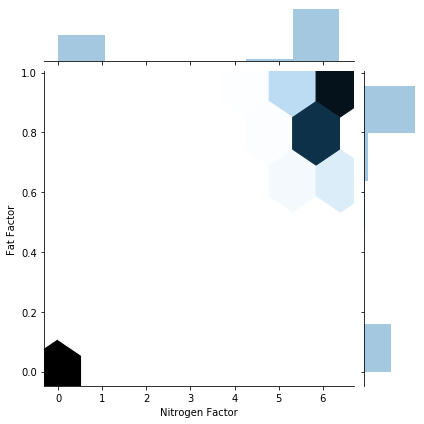

In [86]:
sns.jointplot(df1['Nitrogen Factor'], df1['Fat Factor'], kind='hex')

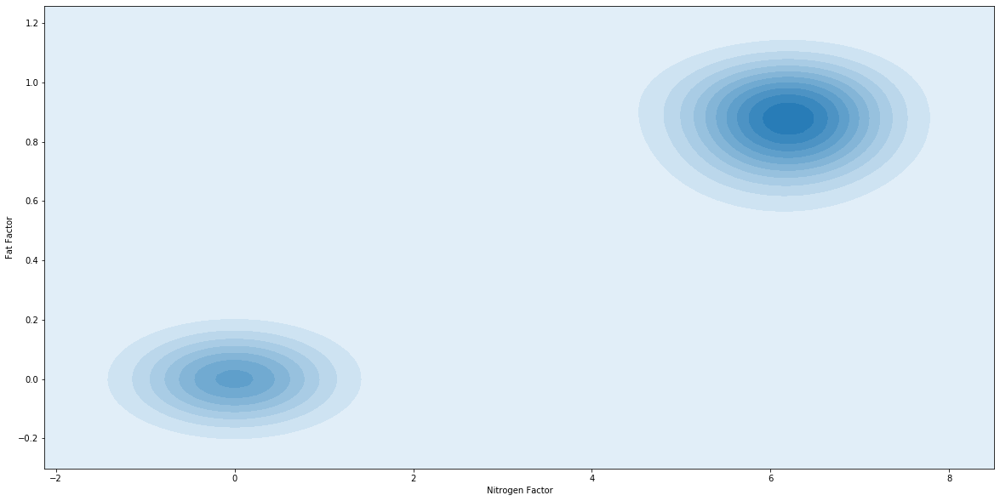

In [88]:
sns.kdeplot(df1['Nitrogen Factor'], df1['Fat Factor'], shade=True)

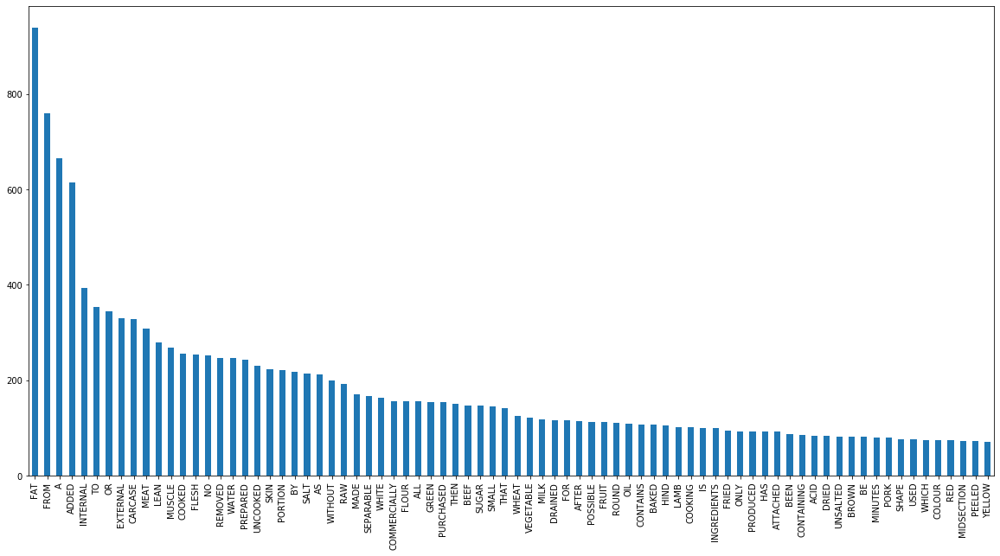

In [112]:
descriptions = df1.Description
mega_descriptions = " ".join(list(descriptions))
no_commas = mega_descriptions.replace(',', " ")
no_fullstops = no_commas.replace('.', " ")
split_words = no_fullstops.split(" ")
stop_words = ["and", "in", "with", '', "the", "of", "also", "an", "are"]
split_words = [x.upper() for x in split_words if x not in stop_words]
words = pd.Series(split_words)
word_counts = words.value_counts()
word_counts[word_counts > 70].plot(kind="bar")
#removing stop words from strings

In [49]:
df1.columns

This is useful for you when you are documenting your dataset, you can make each column a heading, and then describe that column's characteristics.

You can't index a row directly, you need to use the iloc property.

This gives us the row as a _Series_.

↓

Series objects are _very_ similar to dictionaries. They have more properties though.

Doing the same thing on a dataframe gives us the whole column

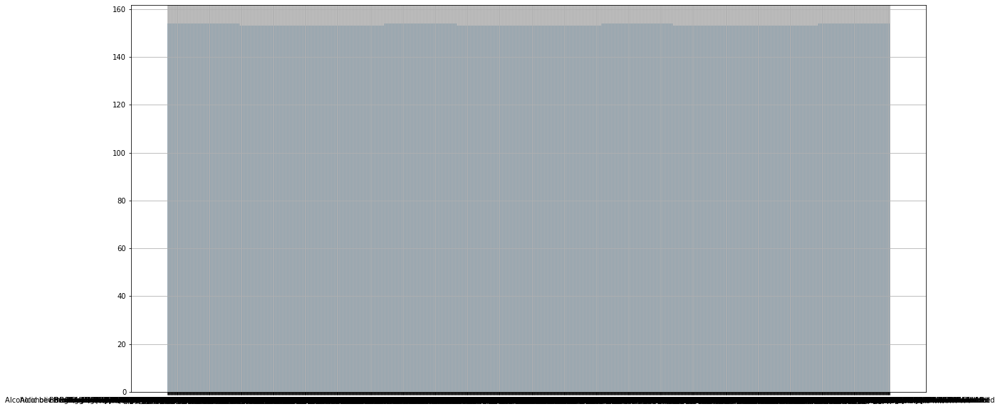

In [106]:
df1["Name"].hist()

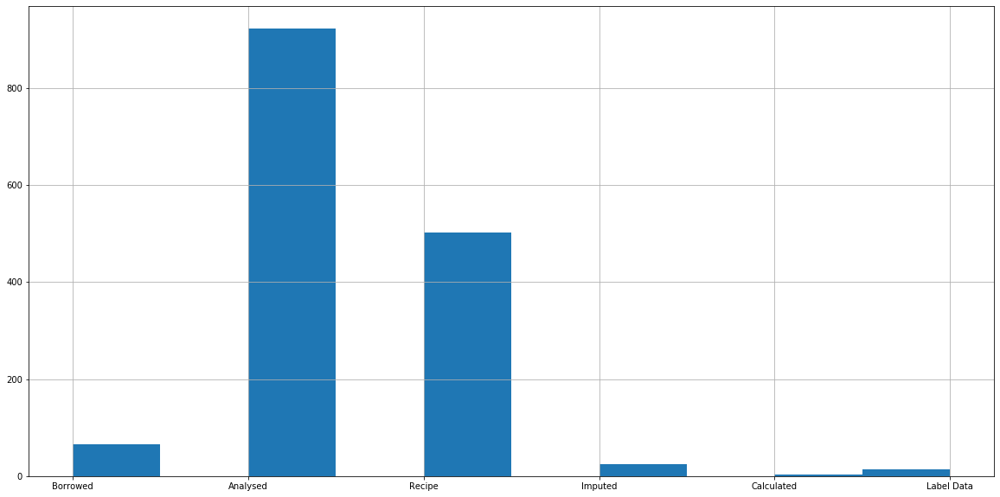

In [107]:
df1["Derivation"].hist()

If we do a simple `plot` on this column we get a pretty dense, but useless graph. It much better one would be a histogram.

The problem we have now is that almost _all_ fines are less than $2000, but there's a very long tail that fills up the right of the graph.

Let's exclude all the values above $3000, and see what it looks like.

We can do that with a nice feature of pandas, boolean indexing:

In [3]:
df1["Name"][df1["Name"] > 0.5].hist()

NameError: name 'df1' is not defined

That's pretty crazy/powerful, so let's see that happen a bit more clearly.

We'll make our own series and call it  `some_numbers`

Let's give it the values 0-99 

In [25]:
# Note the capital S, I have no idea why they did that!
# but if you get an `AttributeError: 'module' object has no attribute 'series'` error...
#                 v
some_numbers = pd.Series(range(100))
some_numbers.head()

0    0
1    1
2    2
3    3
4    4
dtype: int64

We can use boolean indexing to get just the values that are less than 8

In [18]:
some_numbers[some_numbers < 8]

0    0
1    1
2    2
3    3
4    4
5    5
6    6
7    7
dtype: int64

Or we can be fancy and get the numbers that are less than 4 _or_ more than 97:

In [19]:
some_numbers[(some_numbers < 4) | (some_numbers > 97)] #this needs the round brackets,
                                                       # not really sure why.

0      0
1      1
2      2
3      3
98    98
99    99
dtype: int64

We can be _really fancy_ too!

This needs to resolve to a list of booleans that matches the list of inputs. It's filtering only for values that are True.

If we use a list comprehension then we can do almost anything we like!

In [20]:
pets = ["Dog", "Goat", "pig", "Sheep", "Cattle", "Zebu", "Cat", "Chicken", "Guinea pig",         "Donkey", "duck", "Water buffalo", "Western honey bee", "dromedary camel", "Horse", 
        "silkmoth", "pigeon", "goose", "Yak", "Bactrian camel", "Llama", "Alpaca", "guineafowl",         "Ferret", "muscovy duck", "Barbary dove", "Bali cattle", "Gayal", "turkey", "Goldfish", 
        "rabbit", "Koi", "canary", "Society finch", "Fancy mouse", "Siamese fighting fish",         "Fancy rat and Lab rat", "mink", "red fox", "hedgehog", "Guppy"]

pets_series = pd.Series(pets)
pattern_of_bools = ["o" in x for x in pets_series]
print(pattern_of_bools)

pets_series[pattern_of_bools]

[True, True, False, False, False, False, False, False, False, True, False, True, True, True, True, True, True, True, False, False, False, False, True, False, True, True, False, False, False, True, False, True, False, True, True, False, False, False, True, True, False]


0                   Dog
1                  Goat
9                Donkey
11        Water buffalo
12    Western honey bee
13      dromedary camel
14                Horse
15             silkmoth
16               pigeon
17                goose
22           guineafowl
24         muscovy duck
25         Barbary dove
29             Goldfish
31                  Koi
33        Society finch
34          Fancy mouse
38              red fox
39             hedgehog
dtype: object

_Note: the first `in` means a different thing to the second `in`. I was wondering if I should leave this out, but it's probably good to expose you to strange stuff!_

Anyway, back to our fines, it looks like we have a similar pattern of fines here, lots at the bottom end, not so many high value ones. 

In [39]:
penalty_data["FACE_VALUE"][penalty_data["FACE_VALUE"] < 3000].hist()

KeyError: 'FACE_VALUE'

Let's see what's under $1000

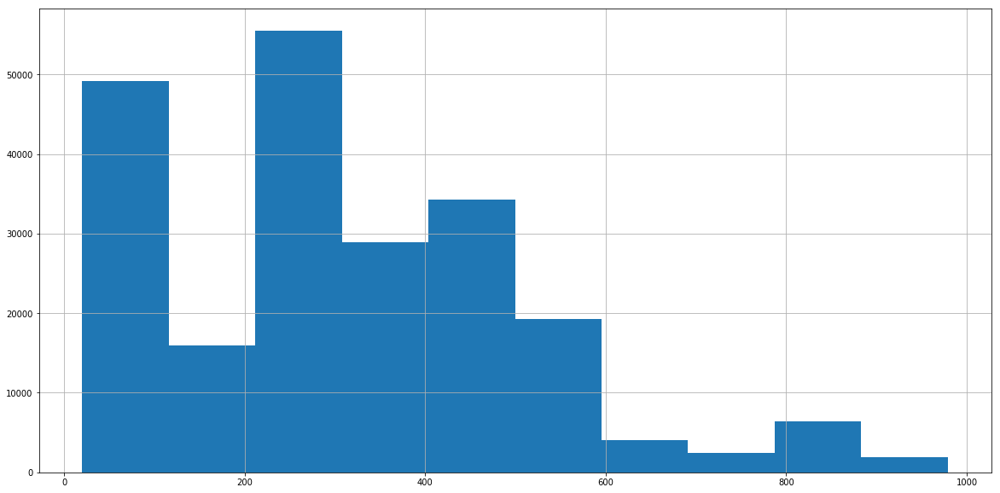

In [22]:
penalty_data["FACE_VALUE"][penalty_data["FACE_VALUE"] < 1000].hist()

This warants some further investigation, but we'll come back to it in a bit. First, let's look at some of the other columns.

In the `LEGISLATION` column it tells us which law was invoked to give this fine. 

In [26]:
penalty_data["Classification Name"].value_counts()

Beef                                                                 120
Lamb and mutton                                                      111
Pork                                                                  80
Fin fish, fresh, frozen                                               70
Chicken                                                               33
                                                                    ... 
Breakfast cereal, mixed grain, with fruit and/or nuts, fortified       1
Sweet biscuits, chocolate-coated, chocolate chip                       1
Fortified beverage flavourings prepared with water or milk             1
Breakfast cereal, corn based, fortified                                1
Fortified dry beverage flavourings                                     1
Name: Classification Name, Length: 268, dtype: int64

*ROAD RULES 2008* and *2014* are pretty popular, but only one person got a ticket under the *COMBAT SPORTS REGULATION 2014* and one other person got booked for something under the *TATTOO PARLOURS REGULATION 2013*

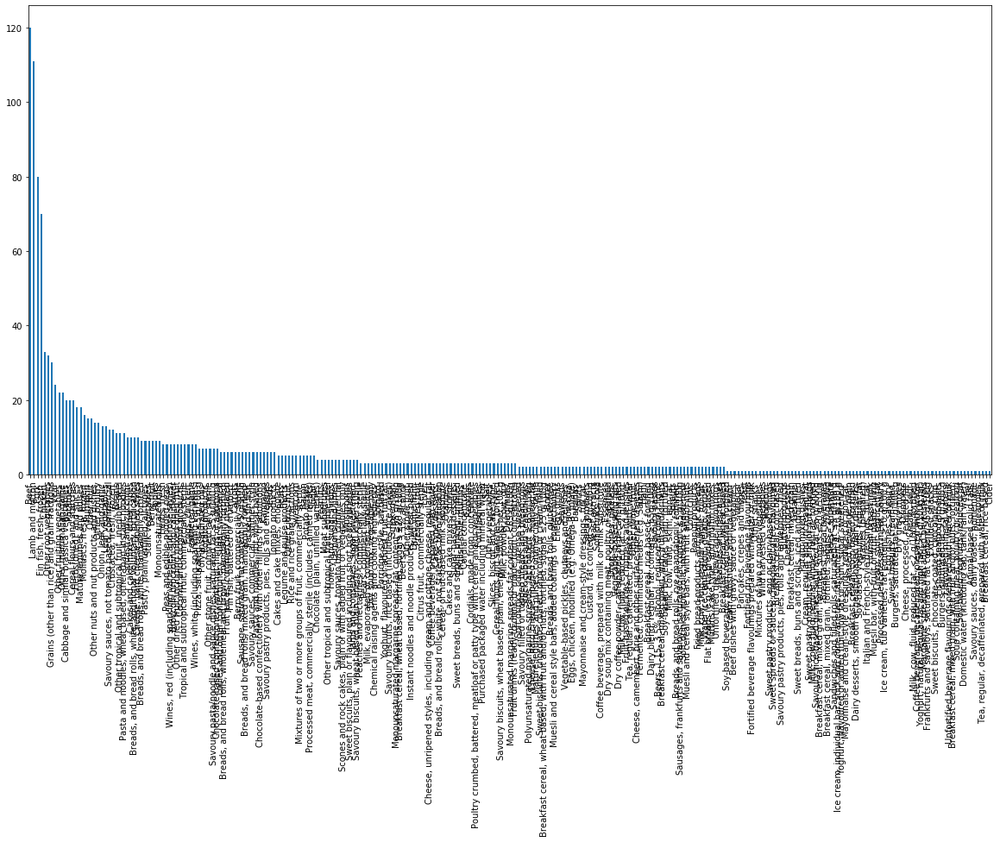

In [17]:
penalty_data["Classification Name"].value_counts().plot(kind="bar")

We're going to see this distribution over and over again as we look at all kinds of data set.

These are probably the most common distributions, but they leave off the [power law](https://en.wikipedia.org/wiki/Power_law), which I think this probably is. 
![](http://blog.cloudera.com/wp-content/uploads/2015/12/distribution.png)
[img](http://blog.cloudera.com/blog/2015/12/common-probability-distributions-the-data-scientists-crib-sheet/)

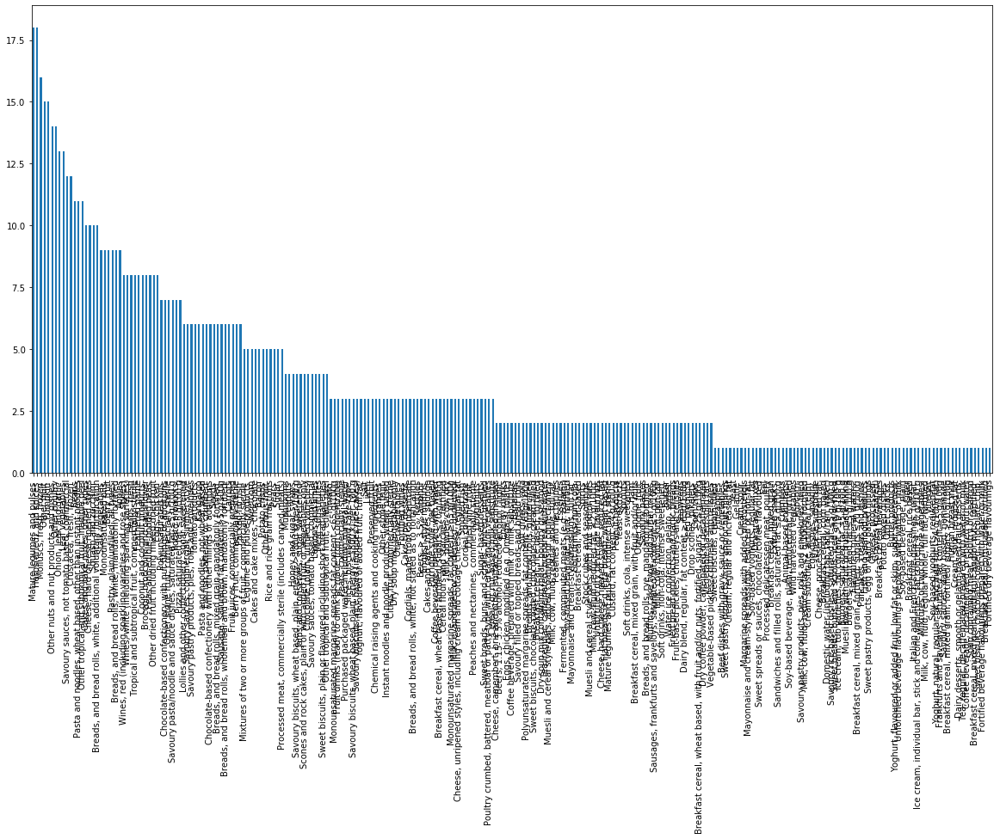

In [33]:
pdvc = penalty_data["Classification Name"].value_counts()
pdvc[pdvc < 20].plot(kind="bar")

This pattern keeps repeating itself:

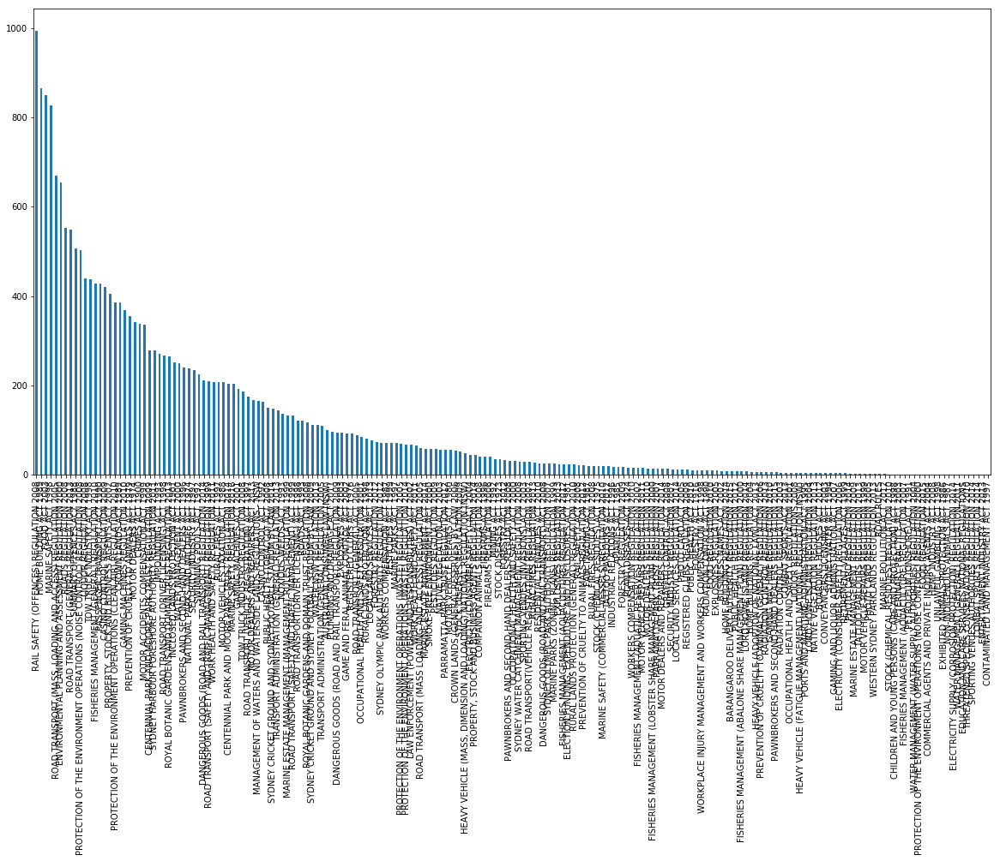

In [26]:
pdvc[pdvc < 1000].plot(kind="bar")

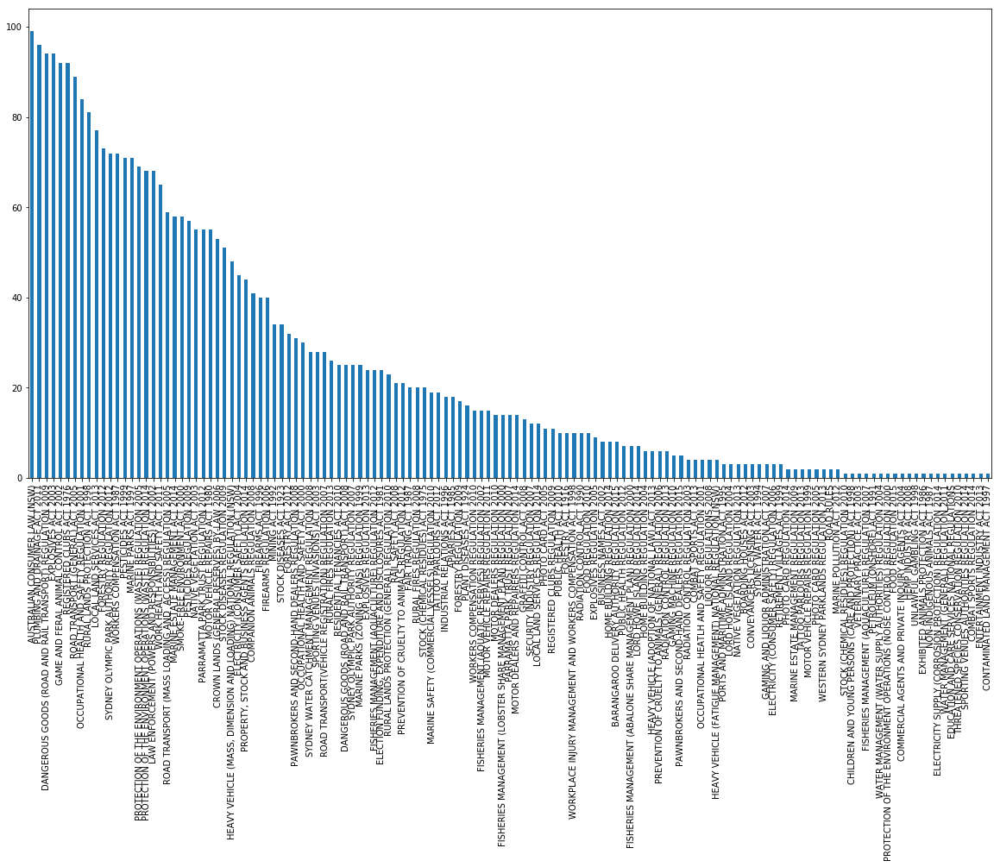

In [27]:
pdvc[pdvc < 100].plot(kind="bar")

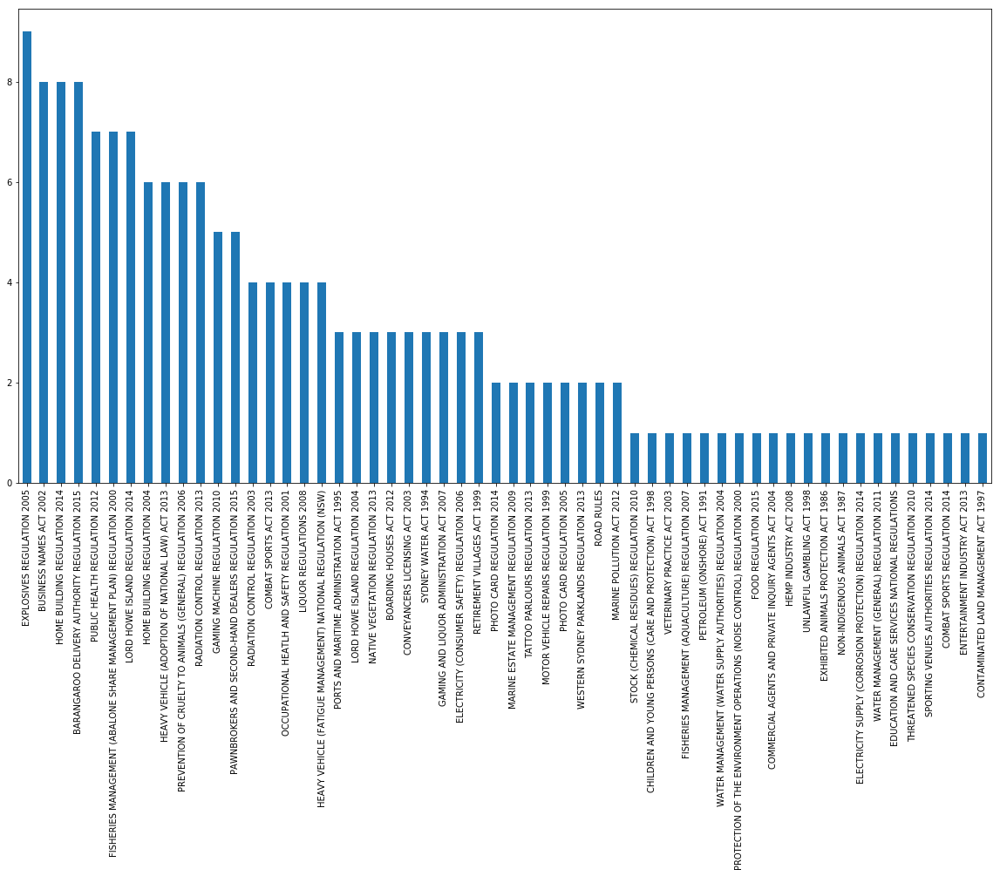

In [28]:
pdvc[pdvc < 10].plot(kind="bar")

# Making plots nice

I said we'd come back to our histogram. [Here's a demo histogram from the matplotlib website](http://matplotlib.org/1.2.1/examples/pylab_examples/histogram_demo.html).

In [44]:
# This bit makes some random data. Ignore it
mu, sigma = 100, 15; x = mu + sigma*np.random.randn(10000)

C:\Users\ben\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


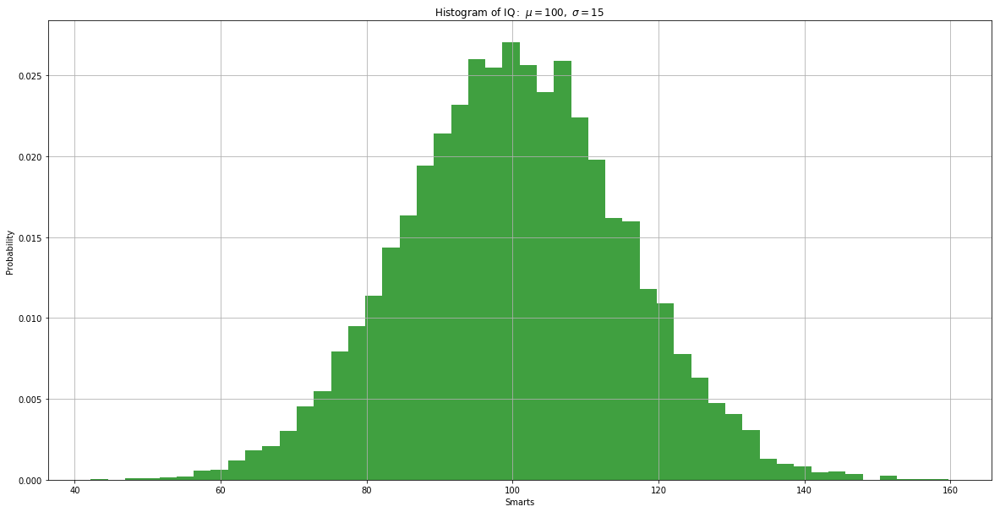

In [46]:
# the histogram of the data
plt.hist(x, 50, normed=1, facecolor='green', alpha=0.75)
plt.xlabel('Smarts')
plt.ylabel('Probability')
plt.title(r'$\mathrm{Histogram\ of\ IQ:}\ \mu=100,\ \sigma=15$') # allows for latex formatting
# plt.axis([40, 160, 0, 0.03])
plt.grid(True)
plt.show()

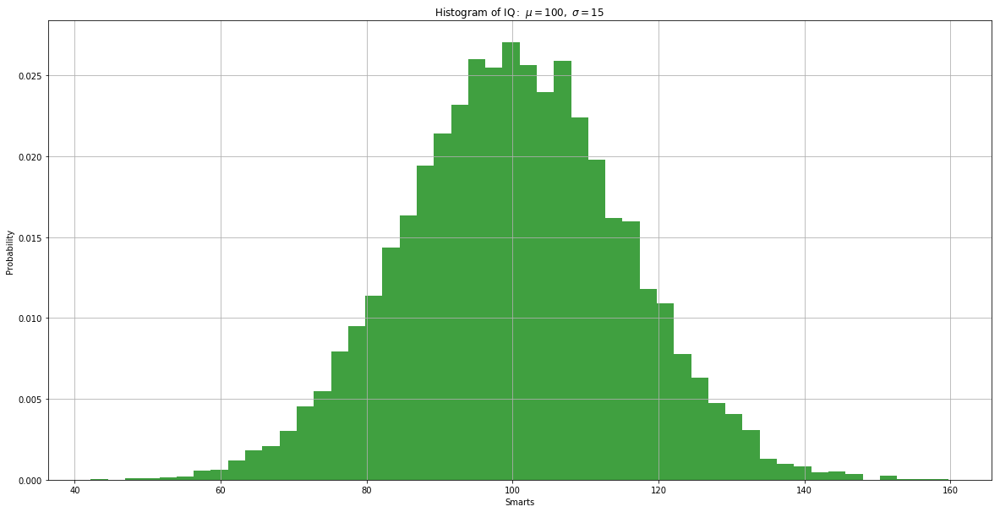

In [45]:
# the histogram of the data
plt.hist(x, 50, density=True, facecolor='green', alpha=0.75)
plt.xlabel('Smarts')
plt.ylabel('Probability')
plt.title(r'$\mathrm{Histogram\ of\ IQ:}\ \mu=100,\ \sigma=15$') # allows for latex formatting
# plt.axis([40, 160, 0, 0.03])
plt.grid(True)
plt.show()

Here's how we made our histogram before:

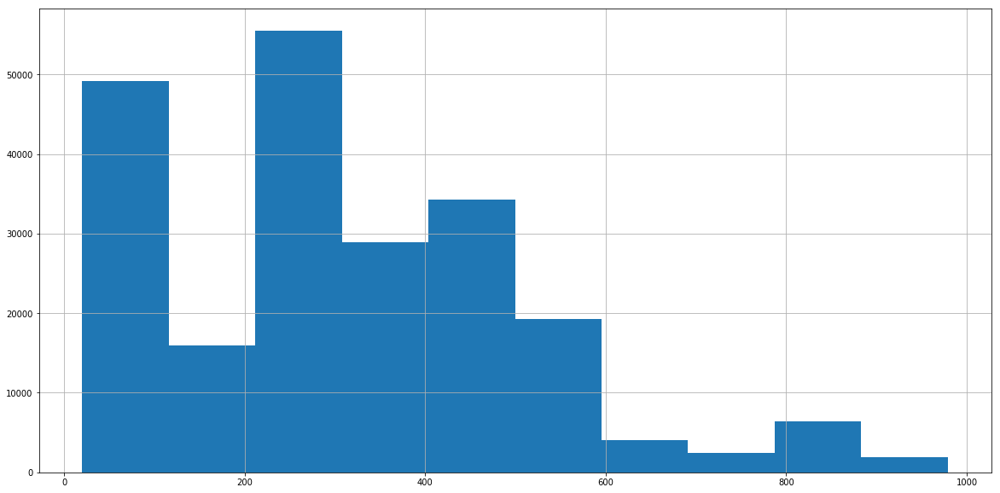

In [30]:
penalty_data["FACE_VALUE"][penalty_data["FACE_VALUE"] < 1000].hist()

And this is how we'd change it so that we can add more features:

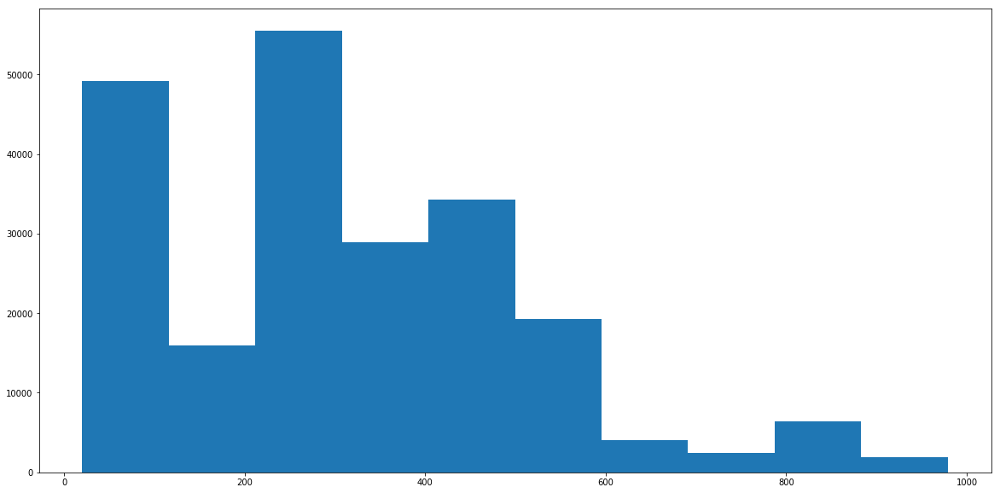

In [31]:
capped_face_value_data = penalty_data["FACE_VALUE"][penalty_data["FACE_VALUE"] < 1000]

plt.hist(capped_face_value_data)
plt.show()

Let's look at some of the things we can do to this. The docs for histograms are here: http://matplotlib.org/api/pyplot_api.html#matplotlib.pyplot.hist

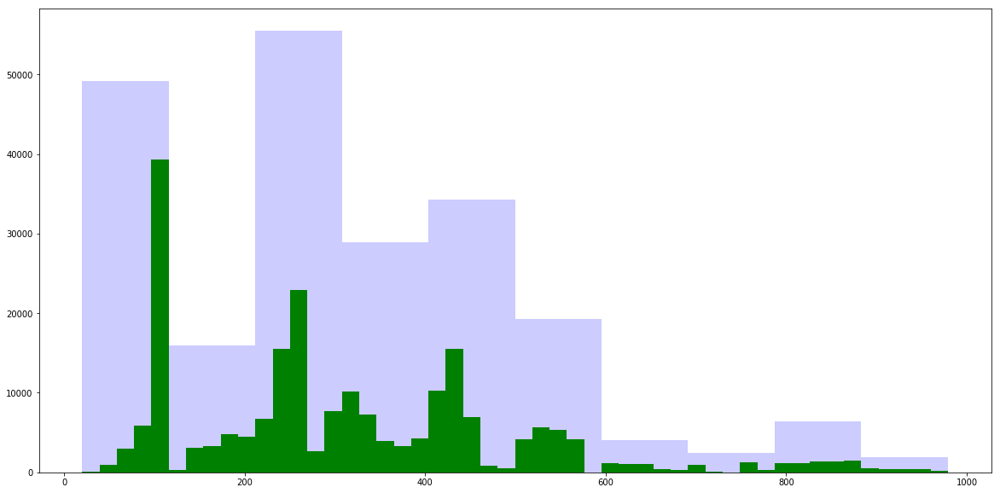

In [32]:
capped_face_value_data = penalty_data["FACE_VALUE"][penalty_data["FACE_VALUE"] < 1000]

plt.hist(capped_face_value_data, bins=10, facecolor='blue', alpha=0.2) #<-old one
plt.hist(capped_face_value_data, bins=50, facecolor='green', alpha=1)  #<-new one
plt.show()

We can go back to our initial, unfiltered, data:

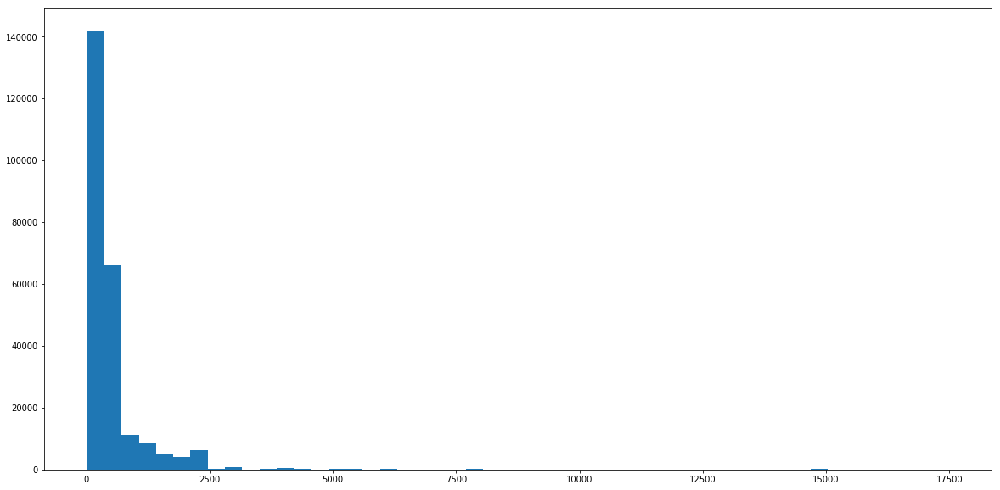

In [33]:
plt.hist(penalty_data["FACE_VALUE"], bins=50)
plt.show()

Instead of doing the filtering before we present the data, we can use the graph to hide the extents of an axis:

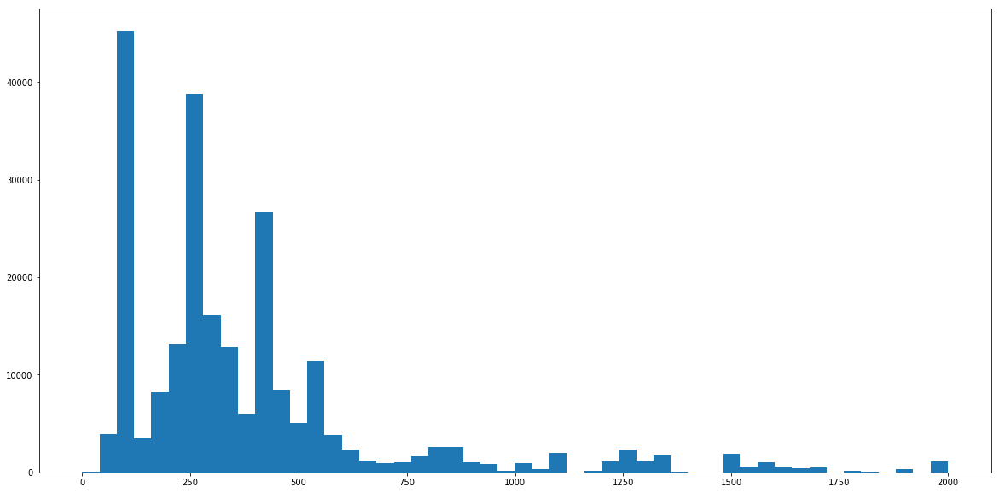

In [34]:
plt.hist(penalty_data["FACE_VALUE"], bins=50, range=(0, 2000))
plt.show()

We can nice that up a bit by pulling the parameters out as variables:
(unmagically, no difference!)

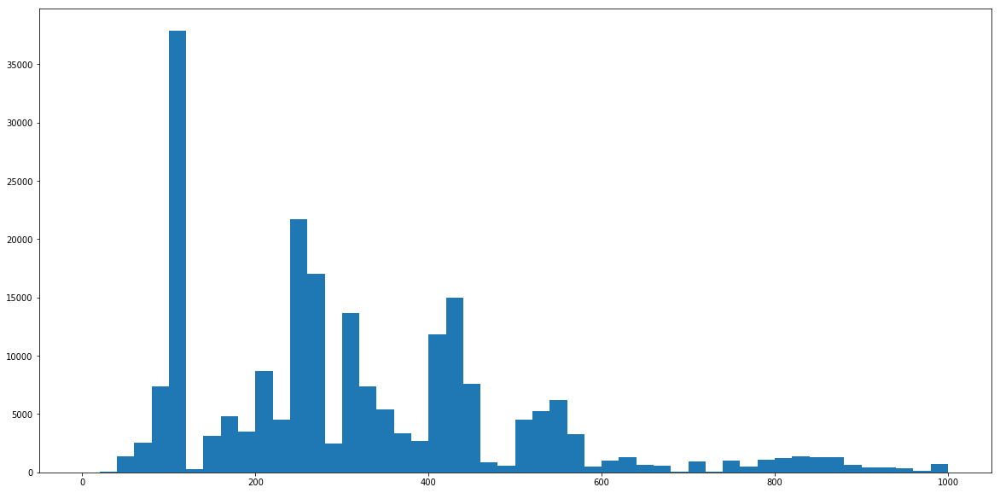

In [35]:
number_of_bins = 50
lower_bound = 0
upper_bound = 1000
plt.hist(penalty_data["FACE_VALUE"], bins=number_of_bins, range=(lower_bound, upper_bound))
plt.show()

This is still pretty naughty, we should have at least a title and some axis lables.

We do that by setting some more properties on the `plt` object:

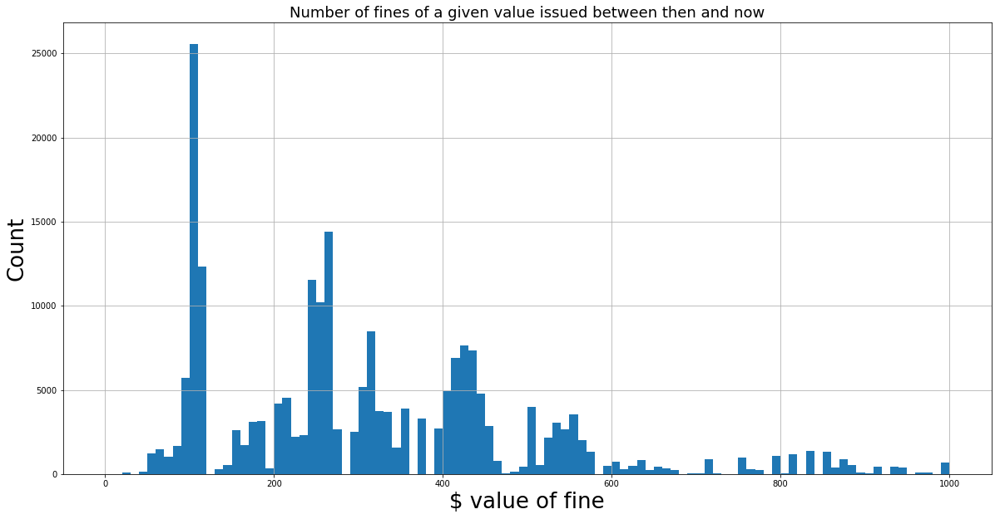

In [36]:
number_of_bins = 100
lower_bound = 0
upper_bound = 1000

plt.hist(penalty_data["FACE_VALUE"], bins=number_of_bins, range=(lower_bound, upper_bound))
plt.title("Number of fines of a given value issued between {} and {}".format("then", "now"), fontsize=18)
plt.xlabel('$ value of fine', fontsize=26)
plt.ylabel('Count', fontsize=26)
plt.grid(True)
plt.show()

We could get the dates from the dataset if we wanted to be clever about it.

If we reimport the date, but with a bit more cleverness, we can tell pandas to convert the dates to actual dates.

Because _we_ are civilised, we use either iso dates `YYYY-MM-DD` or `DD-MM-YYYY`, but often you'll have to deal with data prepared by savages who don't respect this rational behaviour. They will use `MM-DD-YY` and other such primitive formats.

The settings used here control how it's read. You can only really tell by looking at the data and working it out. E.g. are there months bigger than 12?

In [37]:
penalty_data = pd.read_csv(filepath,
                           infer_datetime_format=True,
                           parse_dates=['OFFENCE_MONTH'],
                           dayfirst=True)
penalty_data.head(2)

,OFFENCE_FINYEAR,OFFENCE_MONTH,OFFENCE_CODE,OFFENCE_DESC,LEGISLATION,SECTION_CLAUSE,FACE_VALUE,CAMERA_IND,CAMERA_TYPE,LOCATION_CODE,...,RED_LIGHT_CAMERA_IND,SPEED_CAMERA_IND,SEATBELT_IND,MOBILE_PHONE_IND,PARKING_IND,CINS_IND,FOOD_IND,BICYCLE_TOY_ETC_IND,TOTAL_NUMBER,TOTAL_VALUE
0,2011-2012,2011-07-01,74731,Proceed through red traffic light - Camera Det...,ROAD RULES 2008,59(1),353,Y,Red Light / Speed Camera,7163.0,...,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46,16238
1,2011-2012,2011-07-01,8469,Stop on/near marked foot crossing,ROAD RULES 2008,173(1),265,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,78,20670


This is some straight up, powerful voodoo.

We're grouping the fines by month, and then adding up the groups. Pandas' `groupby` feature allows for all kinds of clever stuff like that.

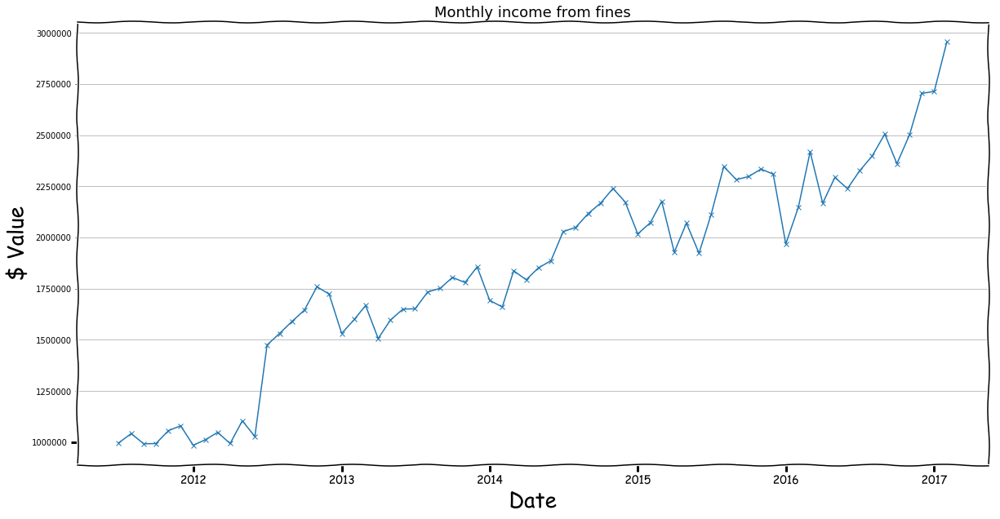

In [48]:
income = penalty_data[["OFFENCE_MONTH","FACE_VALUE"]].groupby("OFFENCE_MONTH").sum()

plt.xkcd()
plt.plot(income, "x-")
plt.title("Monthly income from fines", fontsize=18)
plt.xlabel('Date', fontsize=26)
plt.ylabel('$ Value', fontsize=26)
plt.grid(True)
plt.show()

In [39]:
matplotlib.rcParams.update(saved_style_state) # revert to regular matplotlib styles, not xkcd

I don't expect you to learn this this week, I just want to give you a taste of what can be done, quite simply, with pandas and matplotlib.

# some tricky tricks

Say you have a _lot_ of rows, running things on them takes a long time. You can test on a subset of that and then come bakc to the full dataframe once you are more sure that it works.

To do this we can use python slices in combination with the dataframe's `.loc` property.

In [40]:
ss = penalty_data.loc[:5]

Let's say you want to apply a function to each row in a dataframe, and save the result as a new column in the dataframe. This is where `apply` come in handy.

In [41]:
ss["day"] = ss.apply(lambda x: x.OFFENCE_MONTH.day, axis=1)
ss.head(1)

C:\Users\ben\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,OFFENCE_FINYEAR,OFFENCE_MONTH,OFFENCE_CODE,OFFENCE_DESC,LEGISLATION,SECTION_CLAUSE,FACE_VALUE,CAMERA_IND,CAMERA_TYPE,LOCATION_CODE,...,SPEED_CAMERA_IND,SEATBELT_IND,MOBILE_PHONE_IND,PARKING_IND,CINS_IND,FOOD_IND,BICYCLE_TOY_ETC_IND,TOTAL_NUMBER,TOTAL_VALUE,day
0,2011-2012,2011-07-01,74731,Proceed through red traffic light - Camera Det...,ROAD RULES 2008,59(1),353,Y,Red Light / Speed Camera,7163.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46,16238,1


Above is equivalent to below, it's up to you to decide what is more readable.

In [42]:
def my_f(x):
    return x.day

ss["day"] = ss.apply(my_f, axis=1)
ss.head(1)

C:\Users\ben\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


,OFFENCE_FINYEAR,OFFENCE_MONTH,OFFENCE_CODE,OFFENCE_DESC,LEGISLATION,SECTION_CLAUSE,FACE_VALUE,CAMERA_IND,CAMERA_TYPE,LOCATION_CODE,...,SPEED_CAMERA_IND,SEATBELT_IND,MOBILE_PHONE_IND,PARKING_IND,CINS_IND,FOOD_IND,BICYCLE_TOY_ETC_IND,TOTAL_NUMBER,TOTAL_VALUE,day
0,2011-2012,2011-07-01,74731,Proceed through red traffic light - Camera Det...,ROAD RULES 2008,59(1),353,Y,Red Light / Speed Camera,7163.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46,16238,1


How do we tell the computer to treat _facade_ and _fašade_ the same? What about _University of new south wales_, _University of New South Wales_, _University of NSW_, _UNSW_, _New-south_?

## The answer is _folding_

_(This is a "pattern")_

In [47]:
def fold(given):
    """Return canonical versions of inputs."""
    
    # Use canonical variables so that you can define once, use many times.
    UNSW_canonical = "uni of stairs"
    ben_name_cannonical = "Ben Doherty"

    # dictionary of input:output pairs
    folds = {
        "University of new south wales": UNSW_canonical,
        "University of New South Wales": UNSW_canonical,
        "University of NSW": UNSW_canonical,
        "UNSW": UNSW_canonical,
        "New-south": UNSW_canonical,
        "BDoh": ben_name_cannonical,
        "Benny": ben_name_cannonical,
        "Mr Dockerty": ben_name_cannonical,
        "Oi, Dickehead!": ben_name_cannonical
    }

#     return folds[given] # needs a defensive part, but ommited for clarity.
    default_value = given
    return folds.get(given, default_value)

print(fold("New-south"))
print(fold("BDoh"))

uni of stairs
Ben Doherty


# _fin_